# Предсказание сердечнососудистых заболеваний


## Описание данных

Данные представляют из себя набор статистики из 70000 записей субъективных и объективных признаков пациентов, исследюущихся на наличие сердечнососудистых заболеваний. Целевым аттрибутом является столбец, описывающий наличие болезни : 0 - не имеет сердечнососудистых заболевание, 1 - имеет.

**Присутсвует 3 типа аттрибутов:**

Объективная характеристика: фактическая информация;

Рез. обследования: результаты медицинского обследования;

Субъективная харрактеристика : информация, предоставленная пациентом.

**Аттрибуты:**

Возраст | Объективная характеристика | возраст | int (дни)

Высота | Объективная характеристика | высота | int (см) |

Вес | Объективная характеристика | вес | float (кг) |

Пол | Объективная характеристика | пол | категориальный код |

Артериальное давление | Особенности экзамена | ap_hi | int |

Диастолическое артериальное давление | рез. обследования | ap_lo | int |

Холестерин | рез. обследования  | холестерин | 1: нормально, 2: выше нормы, 3: значительно выше нормы |

Глюкоза | рез. обследования | глюк | 1: нормально, 2: выше нормы, 3: значительно выше нормы |

Курение | Субъективная характеристика | дым | double |

Прием алкоголя | Субъективная характеристика | алкоголь | double |

Физическая активность | Субъективная особенность | активный | double |

Наличие или отсутствие сердечно-сосудистых заболеваний | Целевая переменная | кардио | bool |

Все значения набора данных были собраны во время медицинского осмотра.

## Задача

Предсказание налиция сердечнососудистого заболевания по данным результатов обследования и субъективных характеристик

Ссылка на данные https://www.kaggle.com/sulianova/cardiovascular-disease-dataset

Импорт библиотек:

In [1]:
import numpy as np              # Массивы (матрицы, векторы, линейная алгебра)
import matplotlib.pyplot as plt # Научная графика
%matplotlib inline 
    # Говорим jupyter'у, чтобы весь графический вывод был в браузере, а не в отдельном окне
import pandas as pd             # Таблицы и временные ряды (dataframe, series)
import seaborn as sns           # Еще больше красивой графики для визуализации данных
import sklearn                  # Алгоритмы машинного обучения

# 1. Загрузка данных

In [ ]:
data_raw = pd.read_csv('./Datasets/cardio_train.csv',sep=';')
data_raw.shape

(70000, 13)

In [ ]:
data_raw.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


Имена аттрибутов:

In [ ]:
data_raw.columns

Index(['id', 'age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo',
       'cholesterol', 'gluc', 'smoke', 'alco', 'active', 'cardio'],
      dtype='object')

Определяем категории

In [ ]:
data = data_raw.copy()

data['gender'] = data['gender'].replace([1,2],['male','female']) 
data['gender'] = data['gender'].astype('category')

pd.merge(data[['id','gender']],data_raw[['id','gender']], on='id')

,id,gender_x,gender_y
0,0,female,2
1,1,male,1
2,2,male,1
3,3,female,2
4,4,male,1
...,...,...,...
69995,99993,female,2
69996,99995,male,1
69997,99996,female,2
69998,99998,male,1


In [ ]:
data['active'] = data['active'].astype('category')
data['smoke'] = data['smoke'].astype('category')
data['alco'] = data['alco'].astype('category')
data['cardio'] = data['cardio'].astype('category')

# 2. Визуализация до исправления выбросов

In [ ]:
data_raw.describe()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,49972.419900,19468.865814,1.349571,164.359229,74.205690,128.817286,96.630414,1.366871,1.226457,0.088129,0.053771,0.803729,0.499700
std,28851.302323,2467.251667,0.476838,8.210126,14.395757,154.011419,188.472530,0.680250,0.572270,0.283484,0.225568,0.397179,0.500003
min,0.000000,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,25006.750000,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,50001.500000,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,74889.250000,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,99999.000000,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
data.describe(include=['category'])

,gender,smoke,alco,active,cardio
count,70000,70000,70000,70000,70000
unique,2,2,2,2,2
top,male,0,0,1,0
freq,45530,63831,66236,56261,35021


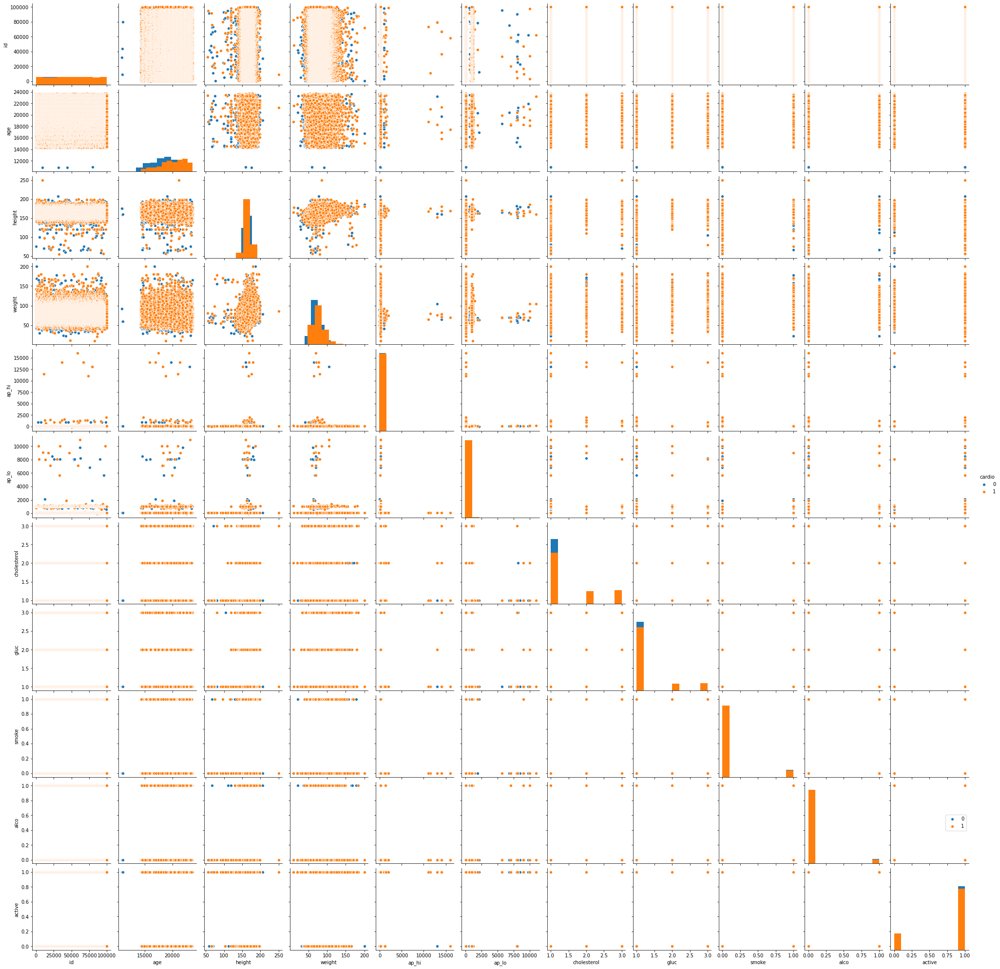

In [ ]:
sns.pairplot(data, hue='cardio', diag_kind='hist')
plt.legend()
pass

Зависимость курения и сердечнососудистых заболеваний

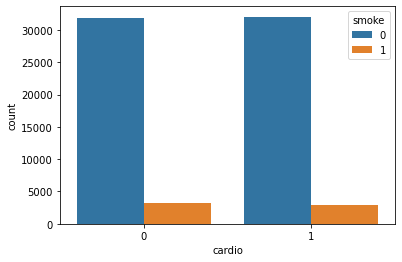

In [ ]:
sns.countplot(x='cardio', order=data['cardio'].value_counts().index, hue='smoke', data=data)
pass

Зависимость наличия болезни в зависимости от возраста и верхнего давления. Большой кружок - активный образ жизни. Как видно, имеется достаточное количество выбросов. Скорее всего, судя по поласам, разделяюще данные - в конец добавлены незначащие нули (1 или 2) 

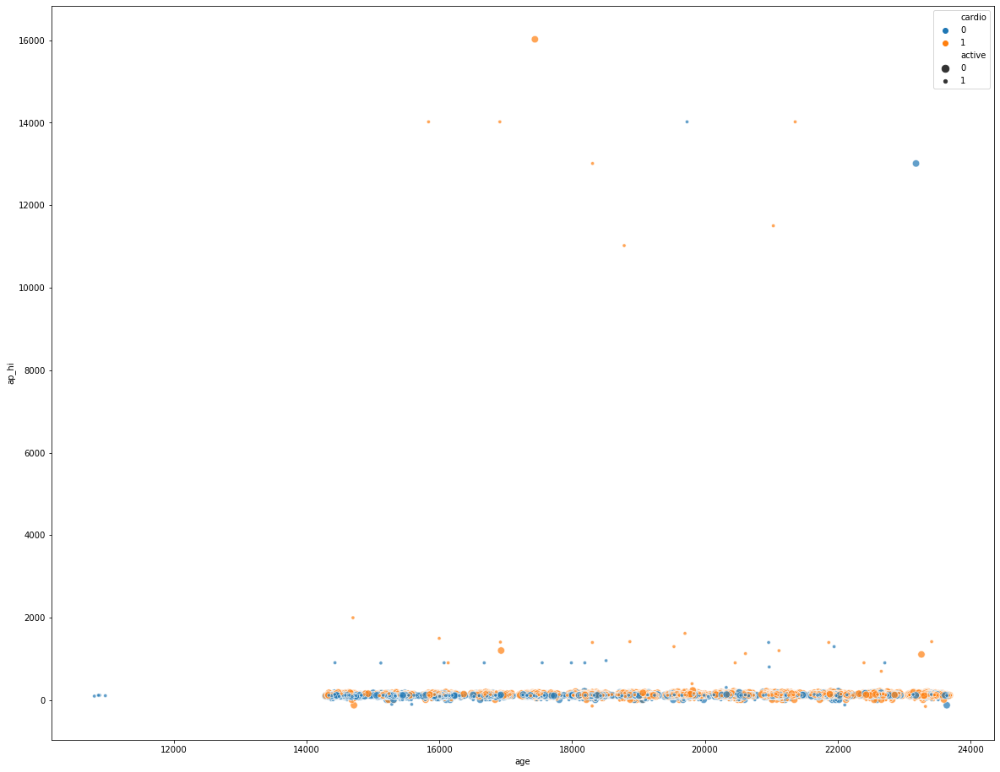

In [ ]:
plt.figure(figsize = (20, 16))
np.random.seed(43)
random_subset = np.random.choice(np.arange(data.shape[0]), size=1000, replace=False)

sns.scatterplot(x='age', y='ap_hi', size='active', hue='cardio', data=data, alpha=0.7)
pass

Зависимость верхнего давления от нижнего

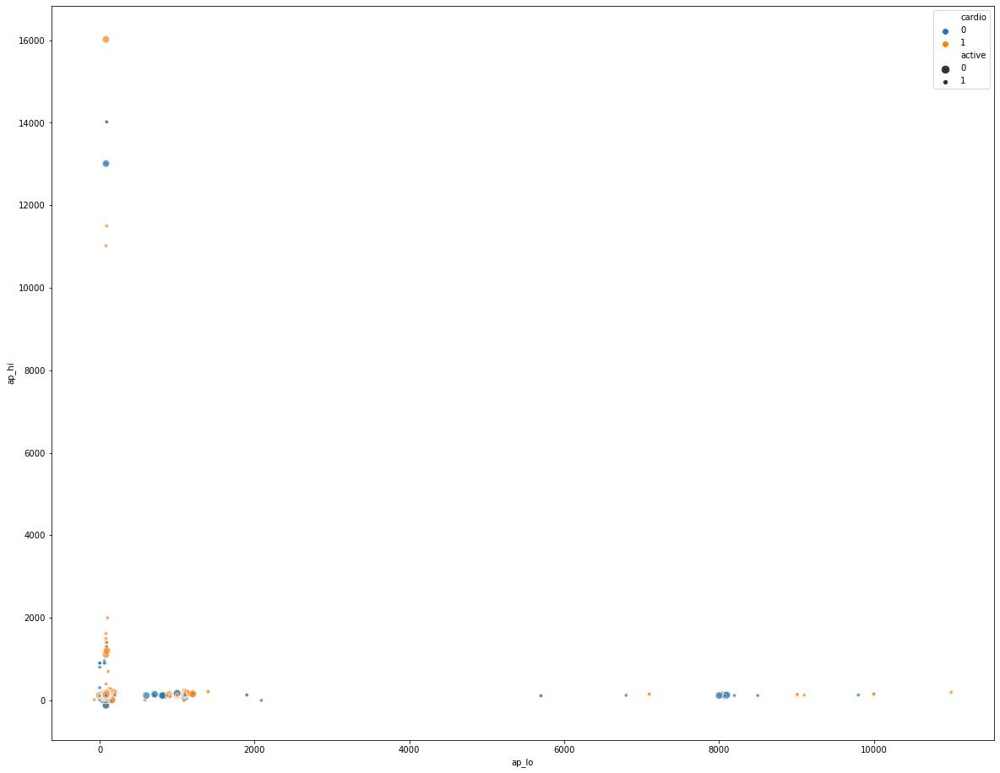

In [ ]:
plt.figure(figsize = (20, 16))
np.random.seed(43)
random_subset = np.random.choice(np.arange(data.shape[0]), size=1000, replace=False)

sns.scatterplot(x='ap_lo', y='ap_hi', size='active', hue='cardio', data=data, alpha=0.7)
pass

# 3. Исправление / удаление выбросов

 Делим значение уровня верхнего давления на 100 и на 10 в зависимости от его значения :

In [ ]:
cdata = data.copy()
#cdata[data['ap_hi']  >= 10000,'ap_hi'] = cdata[data['ap_hi']  >= 10000,'ap_hi'].map(lambda x : x // 100) 
cdata.loc[cdata['ap_hi']  >= 10000,'ap_hi'] = cdata.loc[cdata['ap_hi']  >= 10000,'ap_hi'] // 100
cdata.loc[cdata['ap_hi']  >= 250,'ap_hi'] = cdata.loc[cdata['ap_hi']  >= 250,'ap_hi'] // 10

Рассмотрим нижнее давление

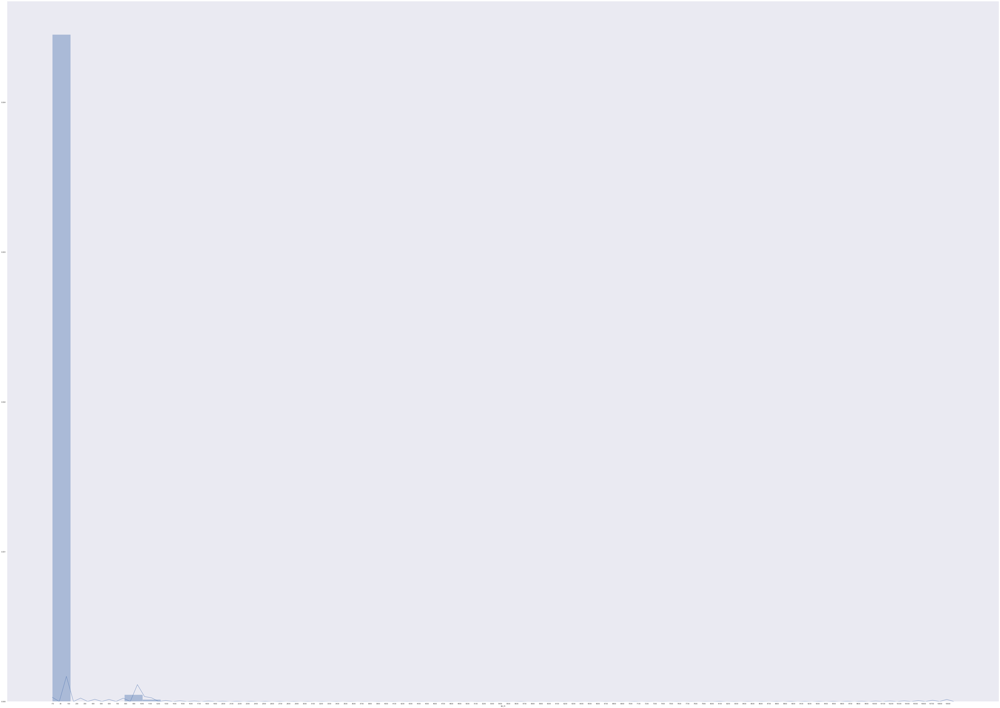

In [ ]:
sns.set(rc={'figure.figsize':(110.7,80.27)})
sns.distplot(cdata['ap_lo'])
plt.xticks(np.arange(np.min(cdata['ap_lo']), np.max(cdata['ap_lo'])+1, 100.0))
plt.grid()

Имеется, кроме пика правильных значений, маленькие пики там, где даныые увеличины в 10 и в 100 раз. Обновляем Данные

In [ ]:
cdata.loc[cdata['ap_lo'] > 1400,'ap_lo'] = cdata.loc[cdata['ap_lo']  > 1400,'ap_lo'] // 100
cdata.loc[cdata['ap_lo'] >  200,'ap_lo'] = cdata.loc[cdata['ap_lo']  >  200,'ap_lo'] // 10

#cdata.loc[data['ap_lo'] > 1400].sort_values(by='ap_lo')

Обновим отрицательные значения, теперь их величину можно интерпретировать 

In [ ]:
cdata.loc[ (cdata['ap_lo'] < 0) | (cdata['ap_hi'] < 0),['ap_lo','ap_hi' ] ] = cdata.loc[ (cdata['ap_lo'] < 0) | (cdata['ap_hi'] < 0),['ap_lo','ap_hi']].applymap(lambda x: abs(x))
cdata.loc[ (data['ap_lo'] < 0) | (data['ap_hi'] < 0),['ap_lo','ap_hi' ] ]

,ap_lo,ap_hi
4607,80,100
16021,70,115
20536,70,100
23988,90,140
25240,80,120
35040,80,150
46627,80,120
60106,70,15


Удалим строки с заведомо малыми значениями давления

In [ ]:
rows_to_drop =  cdata[(cdata['ap_lo'] < 10) | (cdata['ap_hi'] < 50)].index
cdata = cdata.drop(rows_to_drop)
cdata

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,female,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,male,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,male,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,female,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,male,156,56.0,100,60,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,99993,19240,female,168,76.0,120,80,1,1,1,0,1,0
69996,99995,22601,male,158,126.0,140,90,2,2,0,0,1,1
69997,99996,19066,female,183,105.0,180,90,3,1,0,1,0,1
69998,99998,22431,male,163,72.0,135,80,1,2,0,0,0,1


Посмотрим на зависимость верхнего и нижнего давления без выбросов

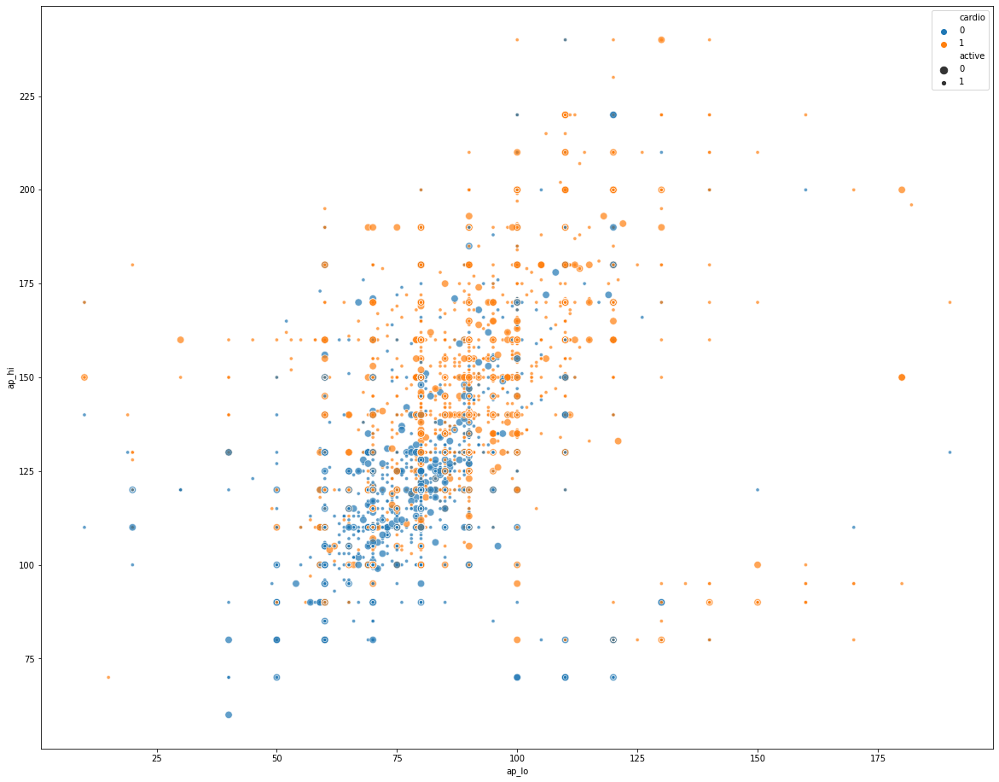

In [ ]:
plt.figure(figsize = (20, 16))
np.random.seed(43)
random_subset = np.random.choice(np.arange(cdata.shape[0]), size=1000, replace=False)

sns.scatterplot(x='ap_lo', y='ap_hi', size='active', hue='cardio', data= cdata, alpha=0.7)
pass

Гораздо лучше! Теперь видима некоторая кореляция высокого давления и болезни. Нарисуем общую диаграму заново

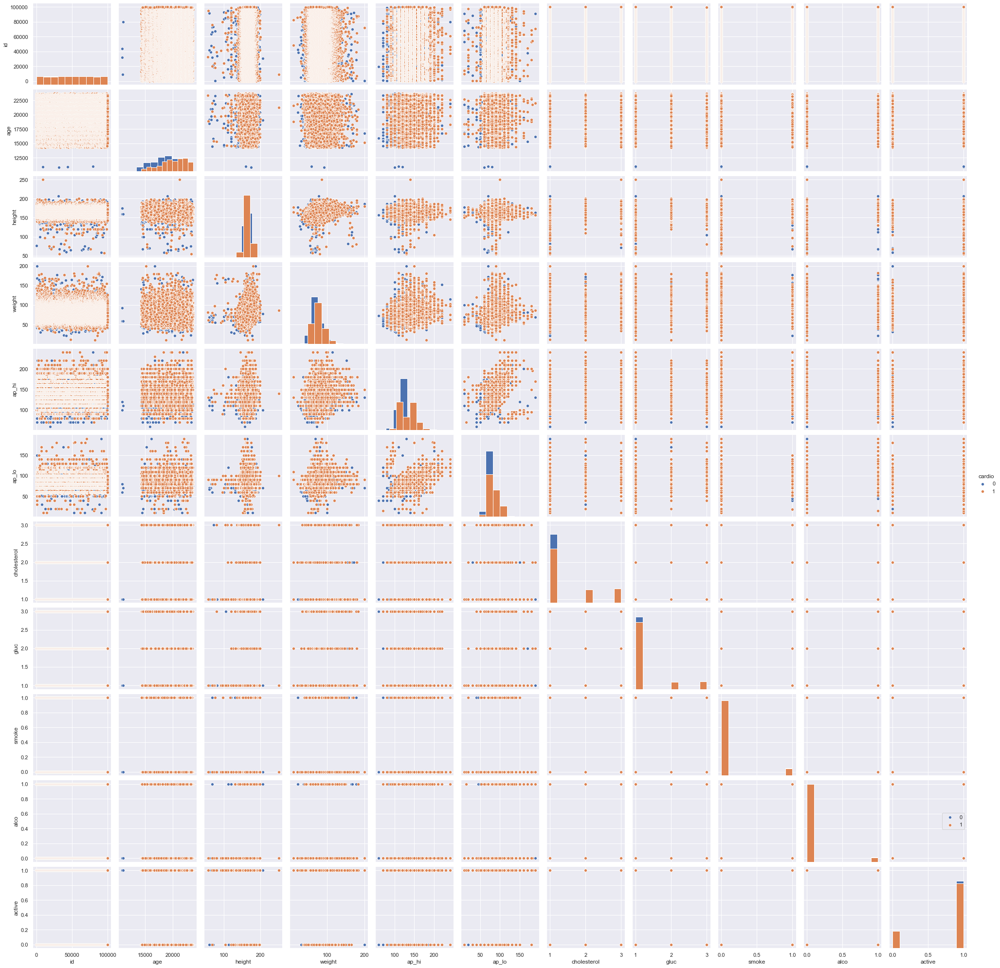

In [ ]:
sns.pairplot( cdata, hue='cardio', diag_kind='hist')
plt.legend()
pass

Проверим квантили возразста

In [ ]:
cdata['age'].quantile([0.005,.01,.05,.1,.5,.9,.95,.99,.995]) / 365

0.005    39.465753
0.010    39.632877
0.050    41.283562
0.100    43.402740
0.500    53.980822
0.900    62.024658
0.950    63.723288
0.990    64.353425
0.995    64.501370
Name: age, dtype: float64

Сохраним очищенный датасет

In [ ]:
df_to_save = cdata.drop(['id'],axis= 1)
with open("Datasets/cardio_filtered.csv", "w") as out:
    out.write(df_to_save.to_csv(index=False))

Значения вполне допустимые

# 3. Визуализация после исправления выбросов

Зависимость уровня глюкозы от возраста

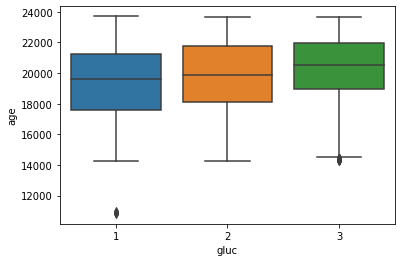

In [ ]:
sns.boxplot(x="gluc", y="age", data=cdata)
pass

Зависимость верхнего давления от возраста

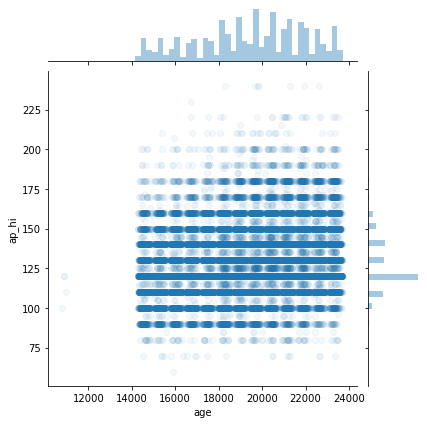

In [ ]:
sns.jointplot(x='age', y='ap_hi', alpha=.05, data= cdata)
pass

Матрица корреляции для количественных признаков

In [ ]:
corr_mat = cdata.corr()
corr_mat

,id,age,height,weight,ap_hi,ap_lo,cholesterol,gluc
id,1.000000,0.003531,-0.003096,-0.002109,0.001781,-0.000136,0.006193,0.002316
age,0.003531,1.000000,-0.082340,0.053277,0.205819,0.150712,0.154530,0.098663
height,-0.003096,-0.082340,1.000000,0.291164,0.016535,0.033015,-0.050443,-0.018777
weight,-0.002109,0.053277,0.291164,1.000000,0.271425,0.251492,0.141932,0.106860
ap_hi,0.001781,0.205819,0.016535,0.271425,1.000000,0.701481,0.195055,0.092443
ap_lo,-0.000136,0.150712,0.033015,0.251492,0.701481,1.000000,0.159010,0.075460
cholesterol,0.006193,0.154530,-0.050443,0.141932,0.195055,0.159010,1.000000,0.452029
gluc,0.002316,0.098663,-0.018777,0.106860,0.092443,0.075460,0.452029,1.000000


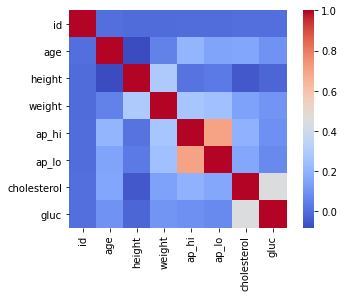

In [ ]:
sns.heatmap(corr_mat, square=True, cmap='coolwarm')
pass

Достаточно сильно коррелирующие признаки - верхнее и нижнее давление. Значение примерно 0.7

# 4. Бинаризация нормальных признаков и отбор атрибутов

Меням назад категориальные признаки на числовые

In [ ]:
cdata.gender.dtype

CategoricalDtype(categories=['female', 'male'], ordered=False)

Кроме того, для предсказания болезней сердца будем использовать все признаки, кроме id

In [ ]:
cdata_norm = cdata.drop(['id'],axis= 1)
cat_columns = cdata_norm.select_dtypes(['category']).columns
cdata_norm[cat_columns] = cdata_norm[cat_columns].apply(lambda x : x.cat.codes)

In [ ]:
cdata_norm.gender.dtype

dtype('int8')

# 5. Нормализация количественных признаков


Нормализуем в отрезок  $[0,1]$

In [ ]:
data_norm = (cdata_norm - cdata_norm.min())/(cdata_norm.max() - cdata_norm.min())
data_norm

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0.588076,0.0,0.579487,0.273684,0.277778,0.388889,0.0,0.0,0.0,0.0,1.0,0.0
1,0.730159,1.0,0.517949,0.394737,0.444444,0.444444,1.0,0.0,0.0,0.0,1.0,1.0
2,0.624003,1.0,0.564103,0.284211,0.388889,0.333333,1.0,0.0,0.0,0.0,0.0,1.0
3,0.528455,0.0,0.584615,0.378947,0.500000,0.500000,0.0,0.0,0.0,0.0,1.0,1.0
4,0.516918,1.0,0.517949,0.242105,0.222222,0.277778,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
69995,0.653659,0.0,0.579487,0.347368,0.333333,0.388889,0.0,0.0,1.0,0.0,1.0,0.0
69996,0.913899,1.0,0.528205,0.610526,0.444444,0.444444,0.5,0.5,0.0,0.0,1.0,1.0
69997,0.640186,0.0,0.656410,0.500000,0.666667,0.444444,1.0,0.0,0.0,1.0,0.0,1.0
69998,0.900736,1.0,0.553846,0.326316,0.416667,0.388889,0.0,0.5,0.0,0.0,0.0,1.0


In [ ]:
X = data_norm.drop(['cardio'],axis= 1)
Y = data_norm['cardio']

Разобьем выборку на обучающую и тестовую

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split( X, Y, test_size = 0.25, random_state = 42)

N_train, _ = X_train.shape 
N_test,  _ = X_test.shape 

N_train, N_test

(52343, 17448)

## 6. Метод ближайщих соседей

Попытаемся разделить выборку по возрасту и вернему давлению

0.8158301969699865 0.6284387895460798
0.7885486120398143 0.6624254928931683
0.7704755172611428 0.6779000458505273
0.7588598284393329 0.6859812012838148
0.750167166574327 0.6954378725355341
0.7459259117742583 0.7004814305364512
0.7415127142120246 0.7017423200366805
0.7400416483579466 0.7060408069692802
0.7378063924498023 0.708276020174232
0.7368511548822192 0.7113709307657038
0.7347114227308331 0.7121160018340211
0.7333167758821619 0.7121160018340211


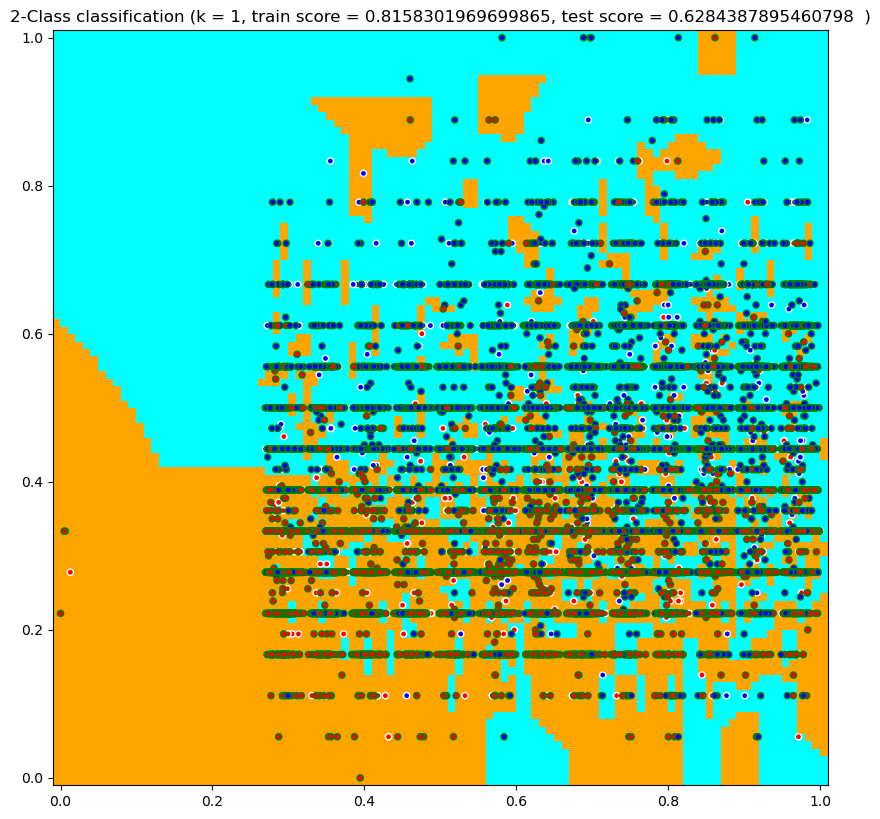

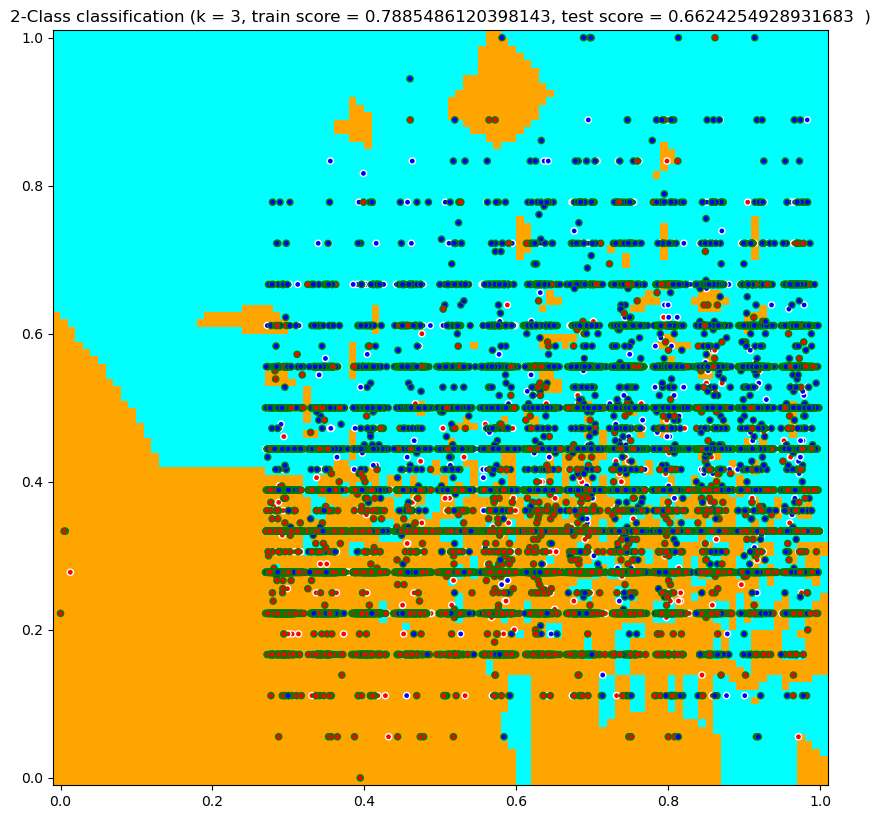

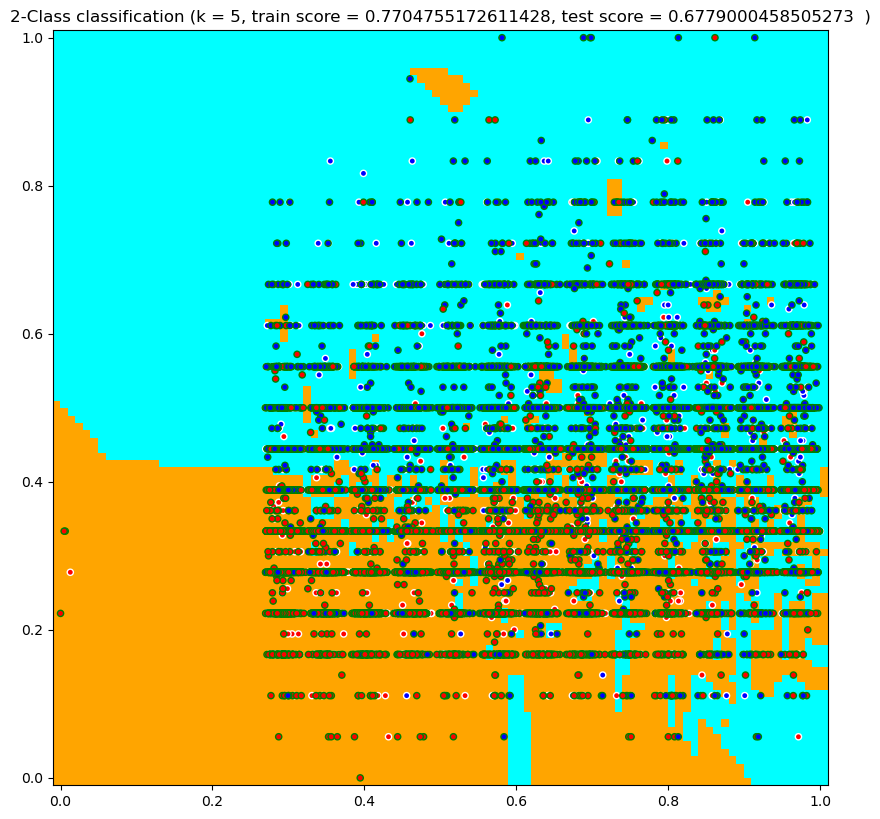

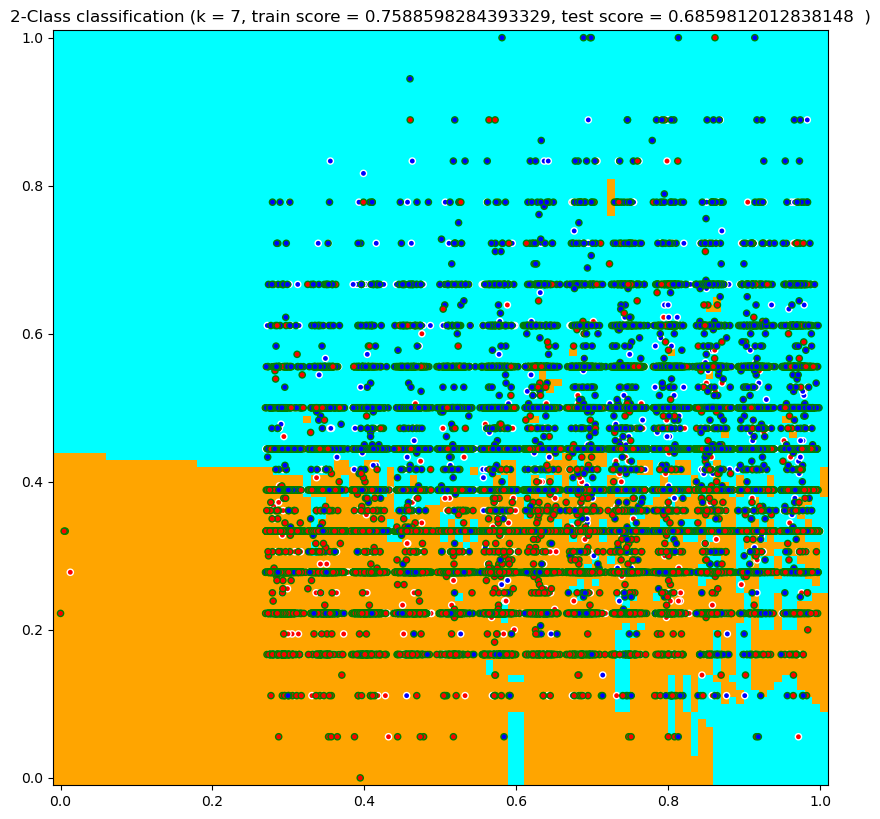

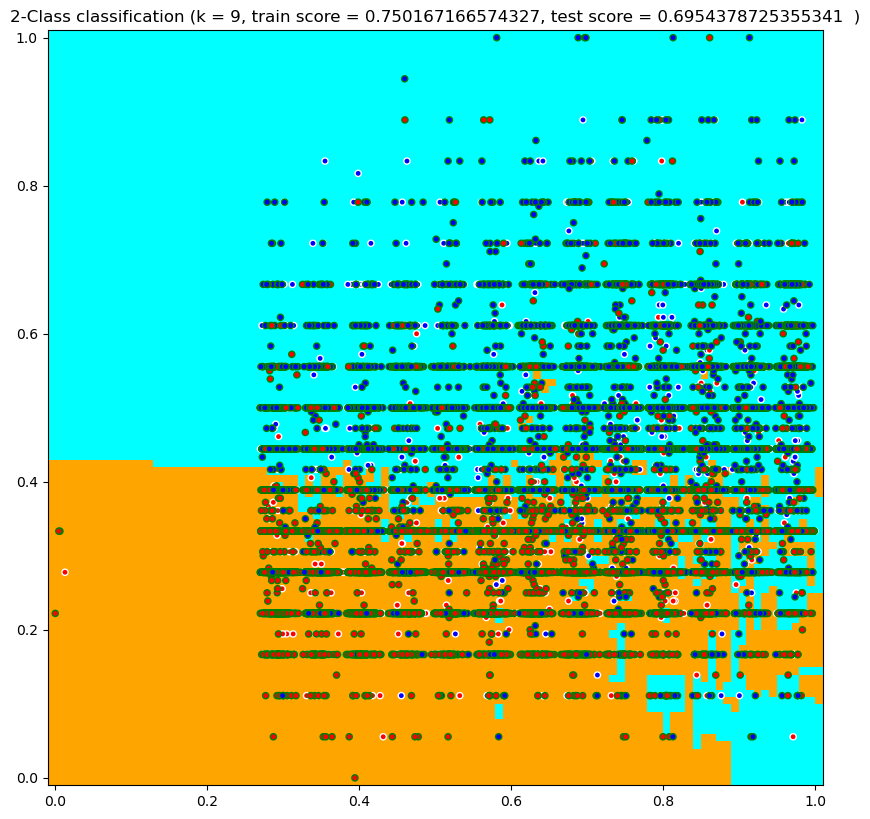

...

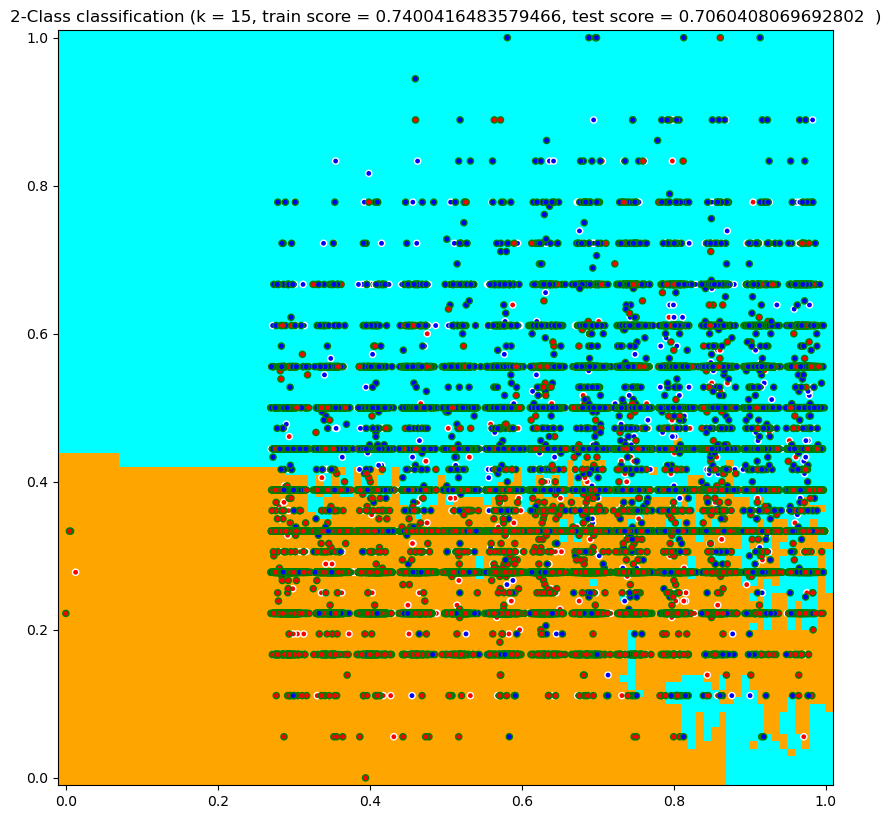

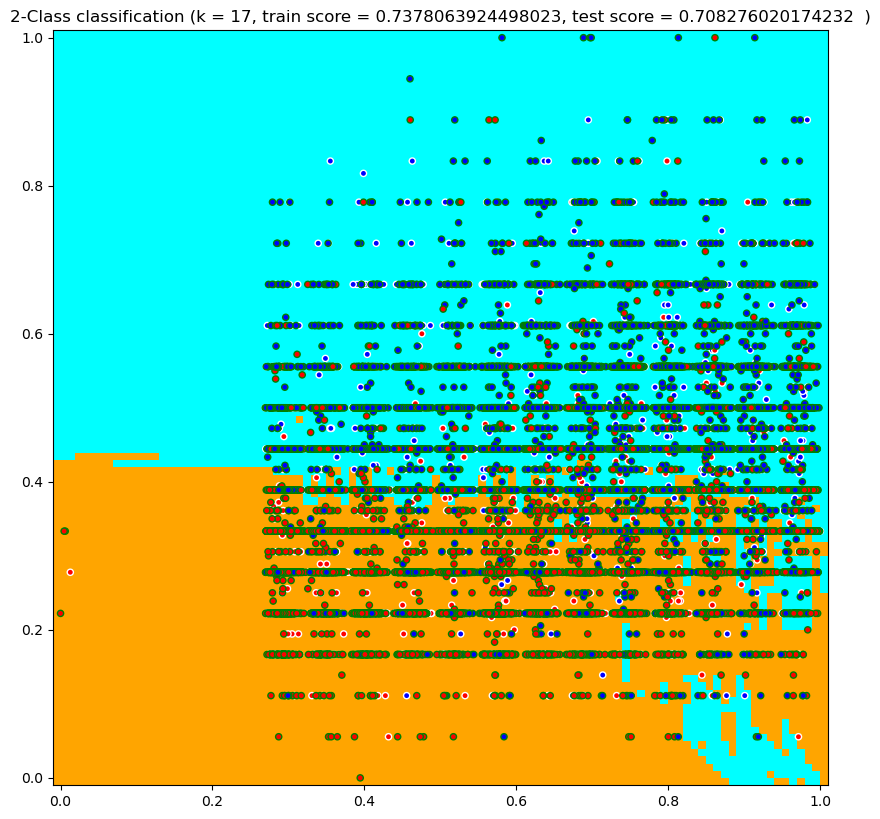

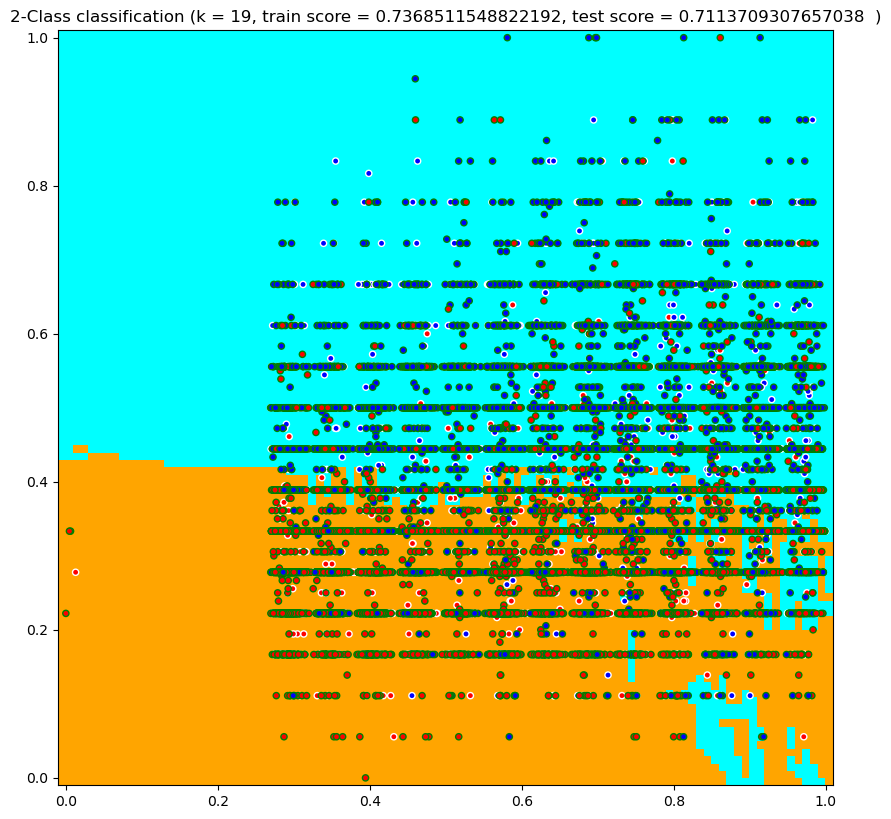

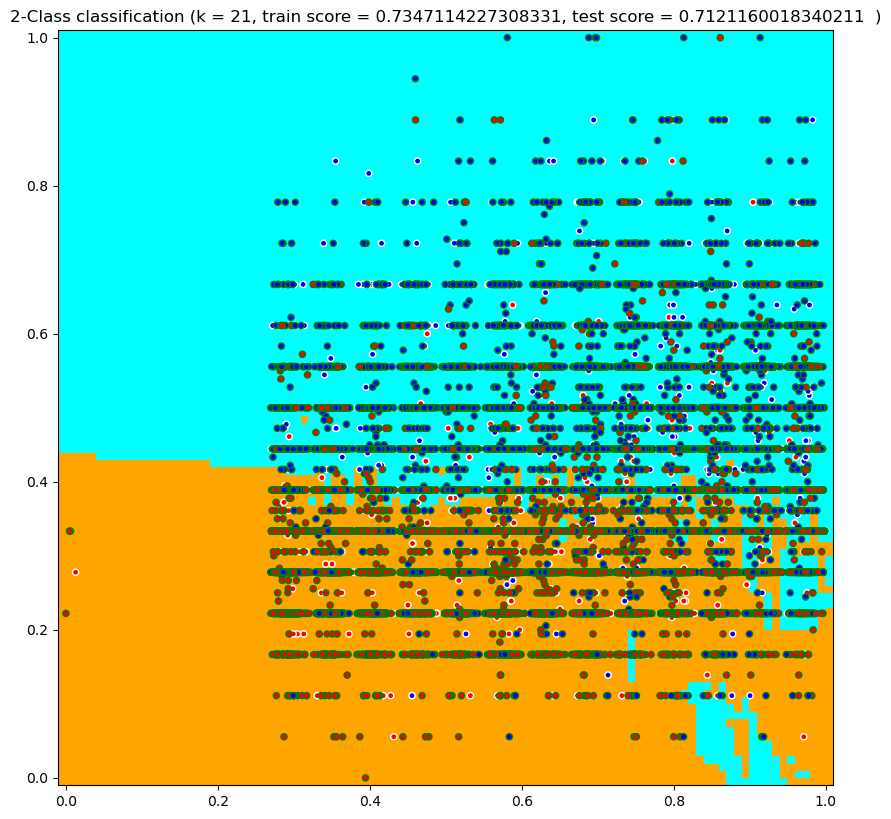

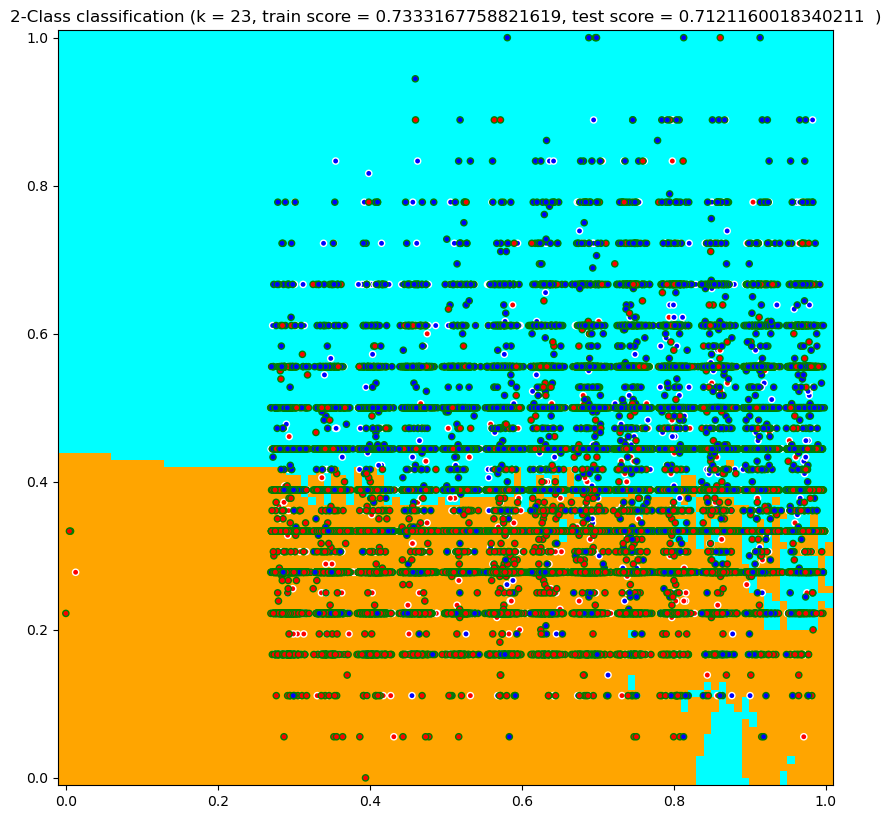

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn import neighbors
from sklearn.metrics import accuracy_score


n_neighbors = 1

attr = ['age', 'ap_hi'] # Desicion making attributes

h = .01  # step size in the mesh

# Create color maps
cmap_light = ListedColormap(['orange', 'cyan'])
cmap_bold = ListedColormap(['red', 'blue'])

metrics_results = list()
for k in range(1,25,2):
    # we create an instance of Neighbours Classifier and fit the data.
    clf = neighbors.KNeighborsClassifier(k, weights='uniform')
    clf.fit(X_train.loc[:,attr], Y_train)

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    xx, yy = np.meshgrid(np.arange(0-h, 1 + 2*h, h ),
                         np.arange(0-h, 1 + 2*h,h ))
    
   
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    
    
    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    #Plot the test points
    plt.scatter(X_test.loc[:, attr[0]], X_test.loc[:, attr[1]], c=Y_test, cmap=cmap_bold,
                edgecolor='w', s=20)
    
    # Plot the training points
    plt.scatter(X_train.loc[:, attr[0] ], X_train.loc[:, attr[1]], c=Y_train, cmap=cmap_bold,
                edgecolor='g', s=20)
    
    
    plt.xlim(0-h, 1+h)
    plt.ylim(0-h, 1+h)
    
    train_score = accuracy_score(Y_train,clf.predict(X_train.loc[:,attr]))
    test_score = accuracy_score(Y_test,clf.predict(X_test.loc[:,attr]))
    print(train_score,test_score)                           
    plt.title("2-Class classification (k = {}, train score = {}, test score = {}  )".format(k,train_score,test_score))
    metrics_results.append({'k': k, 'train' : train_score, 'test' : test_score})
plt.rcParams["figure.figsize"] = [10,10]
plt.rcParams['figure.dpi'] = 100

plt.show()

Зависимость ошибки от колическтва соседей

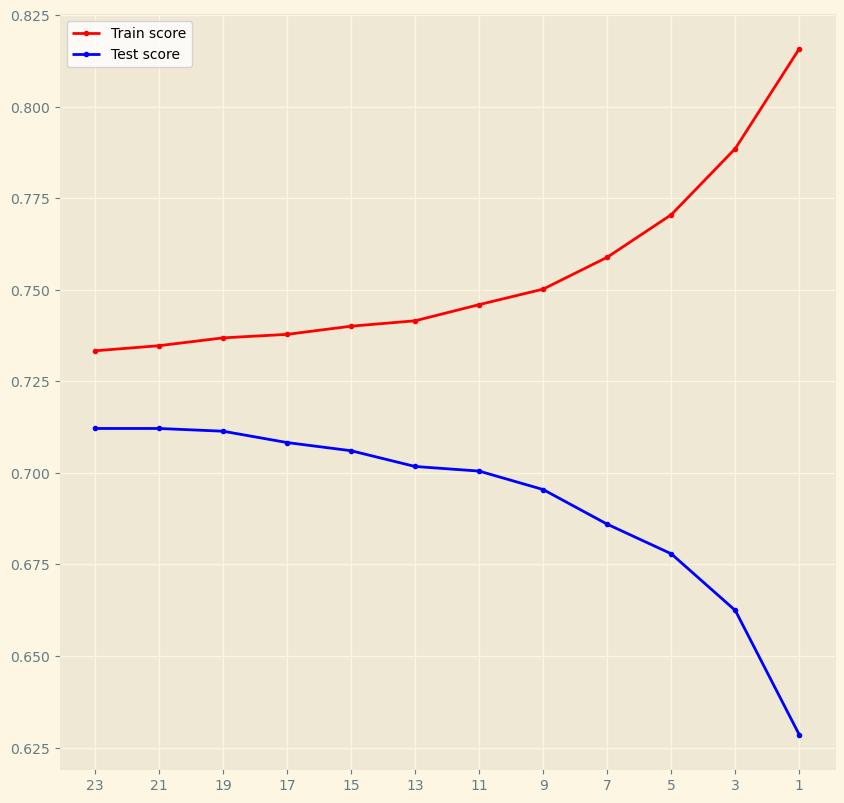

In [ ]:
df = pd.DataFrame(data= metrics_results)

def drawAccuracyBanchmark(df):
    with plt.style.context('Solarize_Light2'):
        plt.plot( df["k"], df["train"],  '.-r', label = 'Train score')
        plt.plot( df["k"], df["test"],  '.-b', label = 'Test score')
    plt.legend(loc = 'best')
    plt.xticks(df["k"])
    plt.gca().invert_xaxis()
    plt.show()
    
drawAccuracyBanchmark(df)

Теперь испоьлзуем для обучения все атрибуты

{'k': 1, 'train': 0.9998662667405384, 'test': 0.6411049977074736}
{'k': 5, 'train': 0.7856828993370651, 'test': 0.6973865199449794}
{'k': 9, 'train': 0.7636360162772482, 'test': 0.7119440623567171}
{'k': 13, 'train': 0.7541600596068242, 'test': 0.7169876203576341}
{'k': 17, 'train': 0.7488871482337658, 'test': 0.7229481889041725}
{'k': 21, 'train': 0.7457730737634449, 'test': 0.7250687757909215}
{'k': 25, 'train': 0.7430793038228607, 'test': 0.7269027968821642}
{'k': 29, 'train': 0.7411879334390463, 'test': 0.7265589179275561}
{'k': 33, 'train': 0.7409013621687713, 'test': 0.7270747363594682}
{'k': 37, 'train': 0.7392774583038801, 'test': 0.7275332416322787}
{'k': 41, 'train': 0.7382649064822421, 'test': 0.7282209995414948}
{'k': 45, 'train': 0.737825497201154, 'test': 0.7278771205868867}
{'k': 49, 'train': 0.7369275738876259, 'test': 0.7271320495185695}
{'k': 53, 'train': 0.7361633838335594, 'test': 0.7256992205410362}
{'k': 57, 'train': 0.7348260512389432, 'test': 0.7269601100412655}

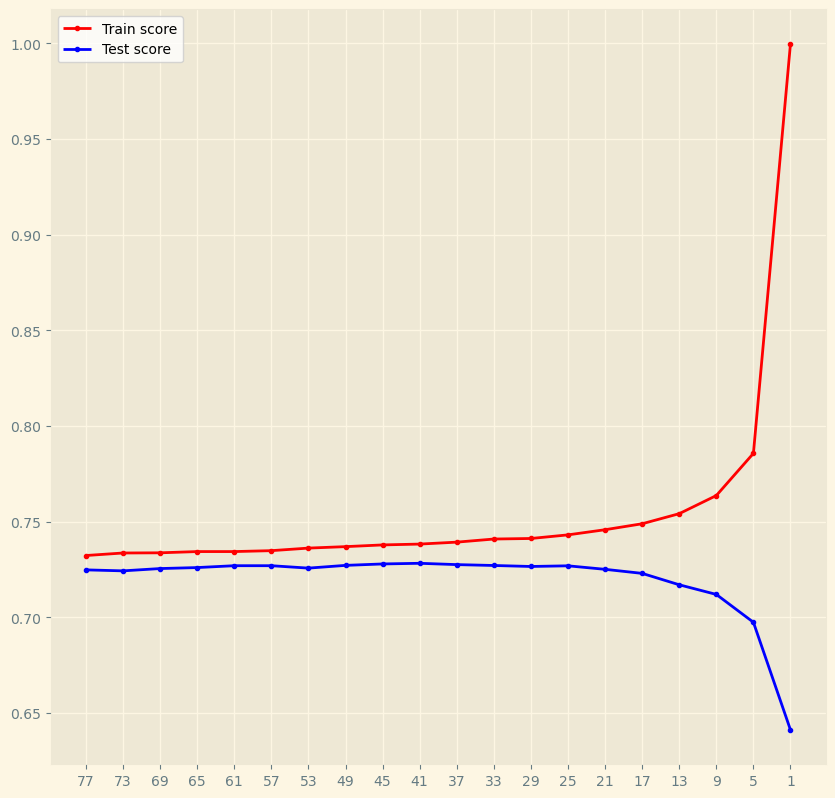

In [ ]:
from sklearn import neighbors
from sklearn.metrics import accuracy_score
from sklearn.utils import parallel_backend

tr_res = list()
with parallel_backend('threading'):
    for k in range(1,80,4):
        clf = neighbors.KNeighborsClassifier(k, weights='uniform')
        clf.fit(X_train, Y_train)
        train_score = accuracy_score(Y_train,clf.predict(X_train))
        test_score = accuracy_score(Y_test,clf.predict(X_test))
        tr_res.append({'k': k, 'train' : train_score, 'test' : test_score})
        print(tr_res[-1])
    
df = pd.DataFrame(tr_res)
drawAccuracyBanchmark(df)

Как видно из графика, после $k = 20$ ошибка на тестовой выбрке почти не изменяется. Обобщающая способность метода k ближайших соседей для этого датасета $\approx 70 \%$

Попробуем использовать для этой задачи трехслойный перцептрон с loss функцией log loss

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.utils import parallel_backend

with parallel_backend('threading'):
    mlp = MLPClassifier(hidden_layer_sizes=(8,8,8), activation='relu', solver='adam', max_iter=500)
    mlp.fit(X_train,Y_train)

    predict_train = mlp.predict(X_train)
    predict_test = mlp.predict(X_test)

Ошибка на обучающей выборке 

In [ ]:
from sklearn.metrics import classification_report,confusion_matrix
print(confusion_matrix(Y_train,predict_train))
print(classification_report(Y_train,predict_train))

[[20757  5406]
 [ 8600 17580]]
              precision    recall  f1-score   support

         0.0       0.71      0.79      0.75     26163
         1.0       0.76      0.67      0.72     26180

    accuracy                           0.73     52343
   macro avg       0.74      0.73      0.73     52343
weighted avg       0.74      0.73      0.73     52343



Ошибка на тестовой выборке

In [ ]:
print(confusion_matrix(Y_test,predict_test))
print(classification_report(Y_test,predict_test))

[[6923 1825]
 [2862 5838]]
              precision    recall  f1-score   support

         0.0       0.71      0.79      0.75      8748
         1.0       0.76      0.67      0.71      8700

    accuracy                           0.73     17448
   macro avg       0.73      0.73      0.73     17448
weighted avg       0.73      0.73      0.73     17448



Ошибка трехслойного перцептрона сравнима с ошибкой метода k ближайших соседей

## Вывод

В результате работы датасет, содержищий информацию о пациентах, был очищен от явных выбросов, а именно от неправильно введенных данных велечины верхнего и нижнего давления. Данные были раздеделны на тестовую и обучающую выборку, было определено оптимальное количество соседей = 20 для метода k ближайших соседей. Метод ближайших соседей на тестовой выборке смог правильно классифицировать только 70% данных. Трехслойный перцептрон также не отличился точность классификации, показав 75% точность распознавания сердечнососудистых болезней. Таким образом можно придти к выводу, что выбранного набора данных испоьлзуемые методы классификации подходят плохо.

# Метод главных компонент

Метод главных компонент позволяет уменьшить количество признаков выбоки. Чтобы понизить размерность на единицу в $N$ мерном пространстве методом главных компонент, строится гиперплоскость размерности $N-1$, дисперсия проекций точек выборки на которую максимальна. Можно показать, что направляющий вектор этой гиперплоскости есть собственный вектор, отвечающий максимальному собственному значеню матрицы $X^{T}X$, где $X$ - матрица, строчки которой представляют элементы обучающей выборки. Соответсвующее собственное значение $\lambda$ равно дисперсии данных в гиперплоскости размерности $N-1$, умноженной на мощность обучающей выборки.

In [ ]:
from sklearn.decomposition import PCA

# Define number of components
pca = PCA(n_components=2)

# Compute PCA
PCA_res = dict()
PCA_res[2] = pca.fit(X).transform(X)

print("Главные компоненты (по строкам):")
print(pca.components_)
print("Дисперсии по главным компонентам:")
print(pca.explained_variance_)

Главные компоненты (по строкам):
[[-0.01675275 -0.94814869  0.04251916  0.0237711   0.01103565  0.00718148
  -0.04816198 -0.02977528  0.28199375  0.12184419  0.02478864]
 [-0.00183291 -0.03136885  0.00264999  0.00149541 -0.00383602 -0.00198014
  -0.07826076 -0.03711663 -0.02572201 -0.02312517 -0.99513112]]
Дисперсии по главным компонентам:
[0.24442734 0.15787646]


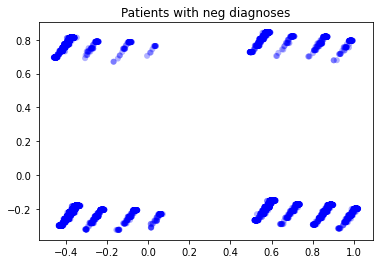

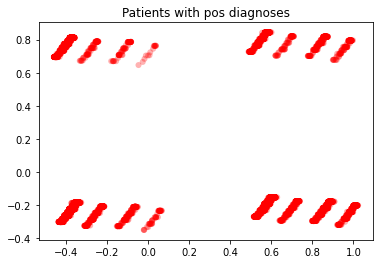

In [ ]:
zipped = np.array(list(zip(PCA_res[2],Y)))
for i,c in enumerate(['b','r']):
    plt.figure()
    comps = list(zip(*[ x[0] for x in zipped if x[1] == i]))
    plt.scatter(comps[0],comps[1] ,c=c,  label=c,
               alpha=0.3, edgecolors='none')
    plt.title("Patients with " + ("pos" if i == 1 else "neg") + " diagnoses" )
plt.plot()
pass

Классы больных и здоровых практически накладываются друг на друга. Рассмотрим три компоненты

Вычислим все возможные разбиения на главные компоненты

In [ ]:
PCA_DF = dict()
for i in range(2,12):
    PCA_res[i] = PCA(n_components=i).fit(X).transform(X)
    PCA_DF[i] = pd.DataFrame([[*elem[0],elem[1]] for elem in list(zip(PCA_res[i],Y))],columns= list(range(i)) + ['res'] )



Случай трех компонент

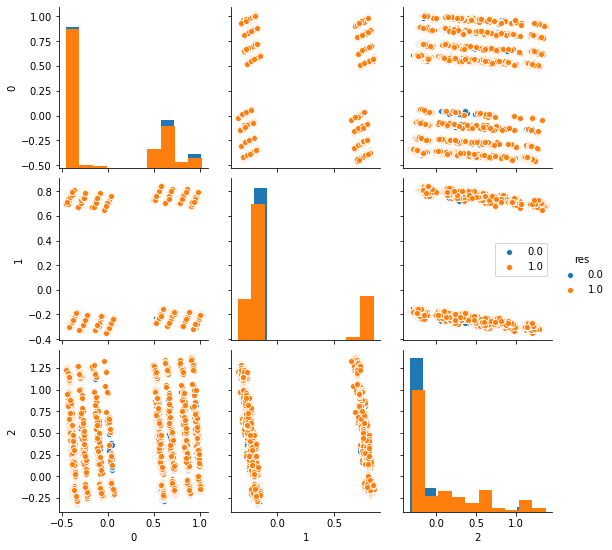

In [ ]:
sns.pairplot( PCA_DF[3], hue='res', diag_kind='hist')
plt.legend()
pass

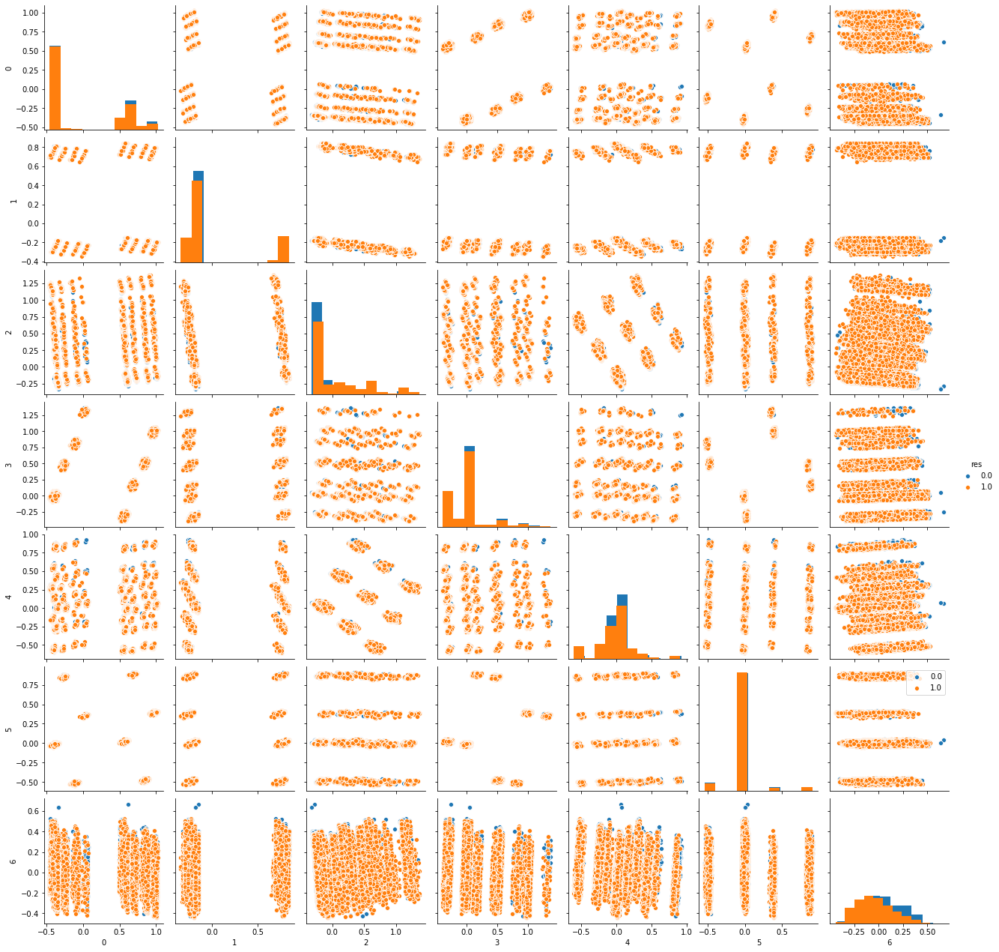

In [ ]:
sns.pairplot( PCA_DF[7], hue='res', diag_kind='hist')
plt.legend()
pass

Используем классификатор $K$ ближайжих соседей для каждой из полученных размерностей 

In [ ]:
from sklearn import neighbors
from sklearn.metrics import accuracy_score

k = 20 
tr_res = list()
for i, x_pca in PCA_res.items() :
    X_train, X_test, Y_train, Y_test = train_test_split( x_pca, Y, test_size = 0.25, random_state = 42)
    clf = neighbors.KNeighborsClassifier(k, weights='uniform')
    clf.fit(X_train, Y_train)
    train_score = accuracy_score(Y_train,clf.predict(X_train))
    test_score = accuracy_score(Y_test,clf.predict(X_test))
    tr_res.append({'k': k, 'train' : train_score, 'test' : test_score, 'dim_pca' : i})
    print(tr_res[-1])

{'k': 20, 'train': 0.7373478784173624, 'test': 0.7109124254928931, 'dim_pca': 2}
{'k': 20, 'train': 0.7234778289360564, 'test': 0.691941769830353, 'dim_pca': 3}
{'k': 20, 'train': 0.7384559539957587, 'test': 0.7099381017881705, 'dim_pca': 4}
{'k': 20, 'train': 0.739907915098485, 'test': 0.7116001834021092, 'dim_pca': 5}
{'k': 20, 'train': 0.7392583535525286, 'test': 0.7125171939477304, 'dim_pca': 6}
{'k': 20, 'train': 0.7300689681523795, 'test': 0.7032897753324163, 'dim_pca': 7}
{'k': 20, 'train': 0.7438052843742239, 'test': 0.7220884915176524, 'dim_pca': 8}
{'k': 20, 'train': 0.7439963318877405, 'test': 0.724438331040807, 'dim_pca': 9}
{'k': 20, 'train': 0.7439772271363888, 'test': 0.7219165520403484, 'dim_pca': 10}
{'k': 20, 'train': 0.7458303880174999, 'test': 0.723922512608895, 'dim_pca': 11}


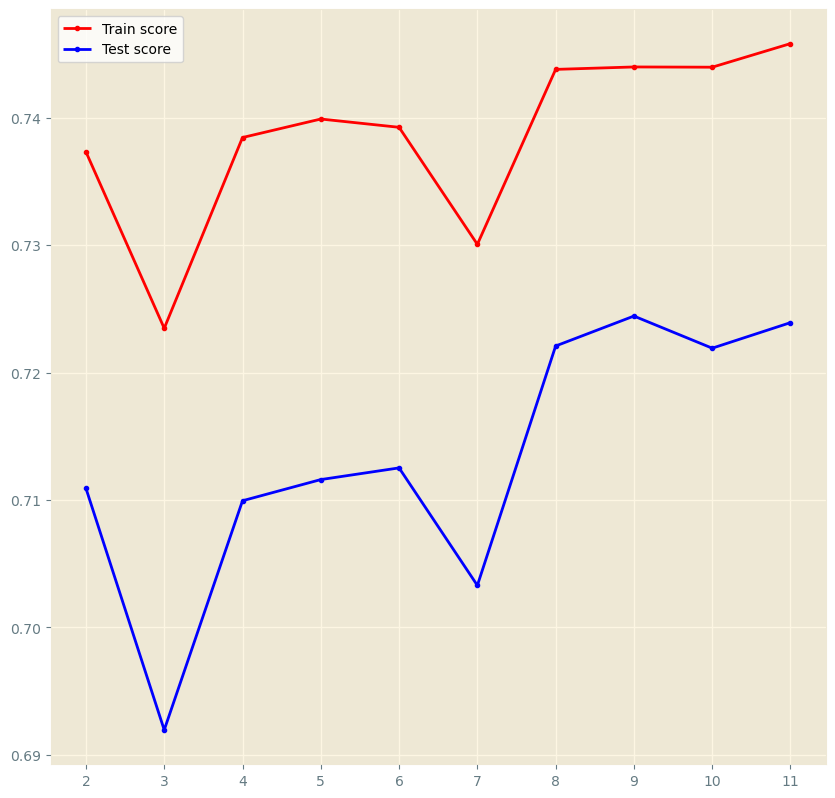

In [ ]:
def drawAccuracyBanchmarkPCA(data):
    df = pd.DataFrame(data= data)
    plt.figure()
    with plt.style.context('Solarize_Light2'):
        plt.plot( df["dim_pca"], df["train"],  '.-r', label = 'Train score')
        plt.plot( df["dim_pca"], df["test"],  '.-b', label = 'Test score')
    plt.legend(loc = 'best')
    plt.xticks(df["dim_pca"])
    plt.rcParams["figure.figsize"] = [10,10]
    plt.rcParams['figure.dpi'] = 100
    plt.show()

drawAccuracyBanchmarkPCA(tr_res)

Из графика зависимости размерности от ошибок на обучении и тесте видно, что лучего результата на тестовой выброке KNN достигла при проеции всех признаков на 9 главных компонент

# Метод опорных векторов

Из графиков видно, что классы выборки линейно неразделимы. Поэтому сразу добавим коэфициент, позволяющий классам "заступать" на территорию друг друга

In [ ]:
from sklearn.svm import SVC # "Support Vector Classifier"
svc_model = SVC(kernel = 'linear', C=1 )
svc_model.fit(PCA_res[2], Y)

SVC(C=1, kernel='linear')

In [ ]:
def draw_sep_curve(model):
    x0_min, x0_max = plt.xlim()
    x1_min, x1_max = plt.ylim()
    x0 = np.linspace(x0_min, x0_max, 30)
    x1 = np.linspace(x1_min, x1_max, 30)
    X1, X0 = np.meshgrid(x1, x0)
    P = np.zeros(X0.shape)
    for i, x0i in enumerate(x0):
        for j, x1j in enumerate(x1):
            P[i, j] = model.decision_function([[x0i, x1j]])
    plt.contour(X0, X1, P, colors = 'k', levels=[-1, 0, 1], alpha = 0.8, linestyles=['--', '-', '--'])
    plt.xlim((x0_min, x0_max))
    plt.ylim((x1_min, x1_max)) 

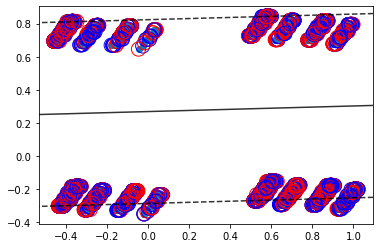

In [ ]:
map_ = [int(x) for x in Y.to_numpy()]
colors = np.array(['b', 'r'])[map_]

plt.scatter(PCA_res[2][:, 0], PCA_res[2][:, 1])
plt.scatter(svc_model.support_vectors_[:, 0], svc_model.support_vectors_[:, 1],
                s = 200, facecolors = 'none',color = colors)
draw_sep_curve(svc_model)


Видно, что метод опорных векторов, совместно с проекцией на две главные компоненты дает очень плохой результат. Посмотрим на результаты классификации линейным методом опорных векторов для каждой из проекций:

In [ ]:
from sklearn.svm import SVC # "Support Vector Classifier"
from sklearn import neighbors
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.utils import parallel_backend


gamma = 0.5
C = 1

tr_res = list()
with parallel_backend('threading'):
    for i, x_pca in PCA_res.items() :
        X_train, X_test, Y_train, Y_test = train_test_split( x_pca, Y, test_size = 0.25, random_state = 42)
        clf = SVC(kernel = 'rbf', C = C, gamma = gamma )
        clf.fit(X_train, Y_train)
        train_score = accuracy_score(Y_train,clf.predict(X_train))
        test_score = accuracy_score(Y_test,clf.predict(X_test))
        tr_res.append({'train' : train_score, 'test' : test_score, 'dim_pca' : i})
        print(tr_res[-1])

{'train': 0.5692260665227442, 'test': 0.5656235671710225, 'dim_pca': 2}
{'train': 0.5916359398582427, 'test': 0.5859697386519945, 'dim_pca': 3}
{'train': 0.5955333091339816, 'test': 0.5900962861072903, 'dim_pca': 4}
{'train': 0.5932025294690789, 'test': 0.5889500229252637, 'dim_pca': 5}
{'train': 0.5932407389717823, 'test': 0.588835396607061, 'dim_pca': 6}
{'train': 0.6361118010049099, 'test': 0.6323933975240715, 'dim_pca': 7}
{'train': 0.7309668914659075, 'test': 0.7300550206327373, 'dim_pca': 8}
{'train': 0.7341955944443384, 'test': 0.7314305364511692, 'dim_pca': 9}
{'train': 0.7334505091416236, 'test': 0.7320036680421825, 'dim_pca': 10}
{'train': 0.7335460328983818, 'test': 0.7314305364511692, 'dim_pca': 11}


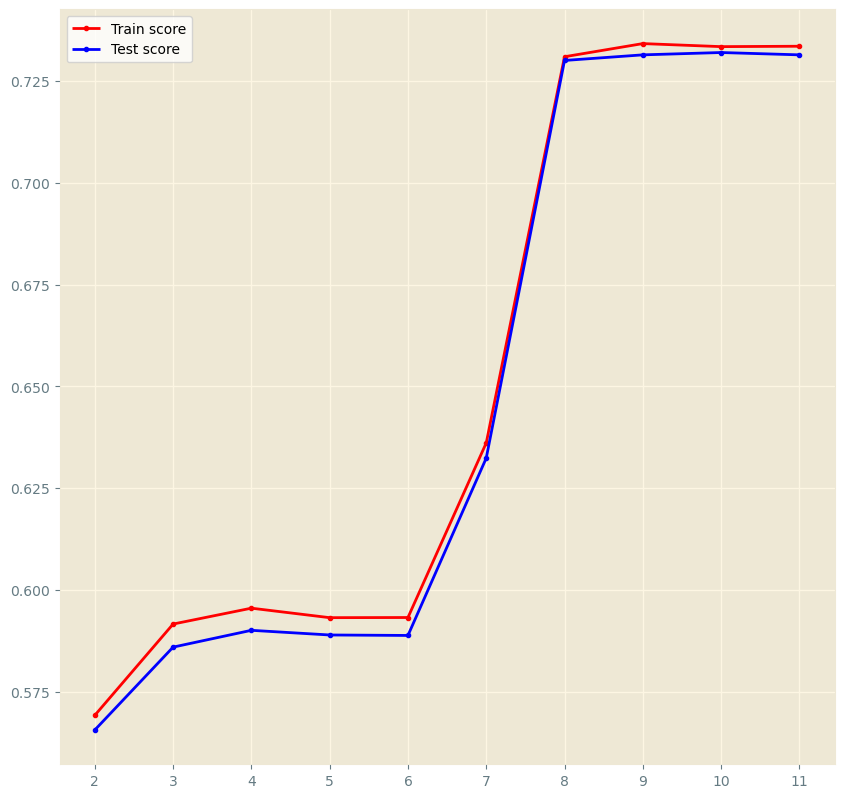

In [ ]:
def drawAccuracyBanchmarkPCA(data):
    df = pd.DataFrame(data= data)
    plt.figure()
    with plt.style.context('Solarize_Light2'):
        plt.plot( df["dim_pca"], df["train"],  '.-r', label = 'Train score')
        plt.plot( df["dim_pca"], df["test"],  '.-b', label = 'Test score')
    plt.legend(loc = 'best')
    plt.xticks(df["dim_pca"])
    plt.rcParams["figure.figsize"] = [10,10]
    plt.rcParams['figure.dpi'] = 100
    plt.show()

drawAccuracyBanchmarkPCA(tr_res)

Видно, что как и в случае с алгоритмом KNN, лучшего результата SVM достигла при проекции всех признаков на 9 главных компонент. В качестве ядра SVM используется следующая функция: $$k(x_i, x_j) = \exp\left(- \frac{d(x_i, x_j)^2}{2l^2} \right)$$ 

## Вывод
Таким образом, используя метод главных компонент удалось сократить количество признаков, при этом незначительно увеличив качество работы на тестовой выборке.

# Деревья решений


## Загрузка датасета


In [2]:
!wget https://github.com/dupeljan/ML-exercises/raw/master/Datasets/cardio_filtered.csv

--2021-03-08 18:20:12--  https://github.com/dupeljan/ML-exercises/raw/master/Datasets/cardio_filtered.csv
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/dupeljan/ML-exercises/master/Datasets/cardio_filtered.csv [following]
--2021-03-08 18:20:12--  https://raw.githubusercontent.com/dupeljan/ML-exercises/master/Datasets/cardio_filtered.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2779128 (2.6M) [text/plain]
Saving to: ‘cardio_filtered.csv.1’

cardio_filtered.csv 100%[===================>]   2.65M  --.-KB/s    in 0.06s   

2021-03-08 18:20:13 (42.0 MB/s) - ‘cardio_filtered.csv.1’ saved [277

In [4]:
df = pd.read_csv('cardio_filtered.csv')
df['gender'] = df['gender'].replace(['male','female'], [0, 1])

X = df.drop(['cardio'],axis= 1)
Y = df['cardio']


In [5]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.33, random_state = 8)
N_test, _ = X_test.shape

In [6]:
X_train, Y_train

(         age  gender  height  weight  ...  gluc  smoke  alco  active
 53715  18810       0     159    60.0  ...     1      0     0       1
 68738  22600       0     163    72.0  ...     1      0     0       1
 16309  22428       0     157    70.0  ...     1      0     0       1
 23335  21002       0     160    60.0  ...     1      0     0       1
 27770  17507       1     156    57.0  ...     1      0     0       1
 ...      ...     ...     ...     ...  ...   ...    ...   ...     ...
 5480   23353       0     163    68.0  ...     1      0     0       1
 10376  14571       0     156    58.0  ...     1      0     0       1
 62426  23245       1     167    78.0  ...     1      1     0       1
 18417  18146       0     172    82.0  ...     1      0     0       0
 25940  16098       1     173    71.0  ...     1      0     0       0
 
 [46759 rows x 11 columns], 53715    0
 68738    1
 16309    0
 23335    1
 27770    1
         ..
 5480     1
 10376    0
 62426    1
 18417    0
 25940    0

In [ ]:
from sklearn.metrics import accuracy_score

def train_forests_classifier(classifier_cls):
  clfs = dict()
  res = list()
  for t in list(range(10, 151, 20)) + [200, 300, 500]:
    clf = classifier_cls(n_estimators=t)
    clfs[t] = clf 
    print(f'Train {t} trees tree')
    clf.fit(X_train, Y_train)
    train_score = accuracy_score(Y_train,clf.predict(X_train))
    test_score = accuracy_score(Y_test,clf.predict(X_test))
    res.append({'train' : train_score, 'test' : test_score, 'trees count' : t})
    print(res[-1])
  return clfs, res

def draw_accuracy_benchmark_forests(data):
    df = pd.DataFrame(data= data)
    plt.figure()
    with plt.style.context('Solarize_Light2'):
        plt.plot( df["trees count"], df["train"],  '.-r', label = 'Train score')
        plt.plot( df["trees count"], df["test"],  '.-b', label = 'Test score')
    plt.legend(loc = 'best')
    plt.xticks(df["trees count"])
    plt.rcParams["figure.figsize"] = [10,10]
    plt.rcParams['figure.dpi'] = 100
    plt.show()


## Random forests

In [ ]:
from sklearn.ensemble import RandomForestClassifier

clfs, res = train_forests_classifier(RandomForestClassifier)

Train 10 trees tree
{'train': 0.9795119656108985, 'test': 0.6977683223341438, 'trees count': 10}
Train 30 trees tree
{'train': 0.9973481041083, 'test': 0.7092740534907954, 'trees count': 30}
Train 50 trees tree
{'train': 0.999337026027075, 'test': 0.7117054532823898, 'trees count': 50}
Train 70 trees tree
{'train': 0.9998075236852798, 'test': 0.7131816602987149, 'trees count': 70}
Train 90 trees tree
{'train': 0.9998502961996621, 'test': 0.7126606460576589, 'trees count': 90}
Train 110 trees tree
{'train': 0.9998930687140444, 'test': 0.7147012851684613, 'trees count': 110}
Train 130 trees tree
{'train': 0.9998930687140444, 'test': 0.7129645710316082, 'trees count': 130}
Train 150 trees tree
{'train': 0.9998930687140444, 'test': 0.7153091351163599, 'trees count': 150}
Train 200 trees tree
{'train': 0.9998930687140444, 'test': 0.7157867315039944, 'trees count': 200}
Train 300 trees tree
{'train': 0.9998930687140444, 'test': 0.7154393886766238, 'trees count': 300}
Train 500 trees tree
{'t

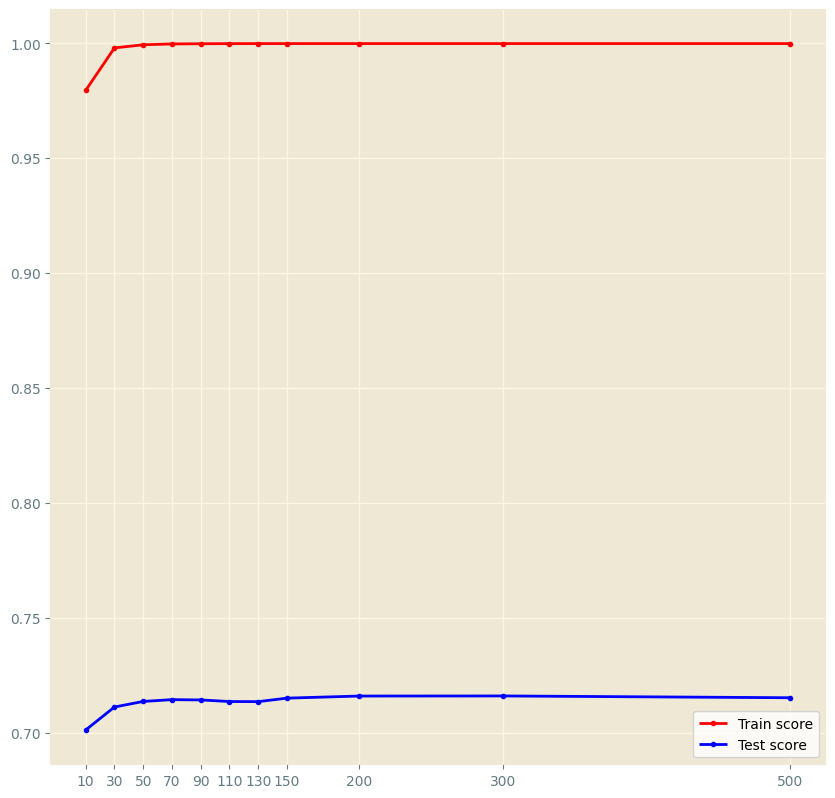

In [ ]:
draw_accuracy_benchmark_forests(res)

Из графика видно, что случайный лес не подвержен переобучению. Однако ввиду того, что тренировочная выборка непрезентативна и, скорее всего, содержит случайный шум, получить результаты лучше, чем в случае остальных классификаторов не удалось

## Gradient boosted trees

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

clfs, res = train_forests_classifier(GradientBoostingClassifier)

Train 10 trees tree
{'train': 0.7256998652665797, 'test': 0.7236453629732547, 'trees count': 10}
Train 30 trees tree
{'train': 0.7333347590838127, 'test': 0.7314171587356721, 'trees count': 30}
Train 50 trees tree
{'train': 0.7362646763189974, 'test': 0.7334577978464745, 'trees count': 50}
Train 70 trees tree
{'train': 0.7379755768942877, 'test': 0.7334143799930531, 'trees count': 70}
Train 90 trees tree
{'train': 0.7391304347826086, 'test': 0.7336314692601598, 'trees count': 90}
Train 110 trees tree
{'train': 0.7397720224983426, 'test': 0.7338919763806877, 'trees count': 110}
Train 130 trees tree
{'train': 0.7405633140144143, 'test': 0.7335880514067384, 'trees count': 130}
Train 150 trees tree
{'train': 0.740841335357899, 'test': 0.733935394234109, 'trees count': 150}
Train 200 trees tree
{'train': 0.7420389657606022, 'test': 0.7342827370614797, 'trees count': 200}
Train 300 trees tree
{'train': 0.743814025107466, 'test': 0.7345432441820077, 'trees count': 300}
Train 500 trees tree
{'

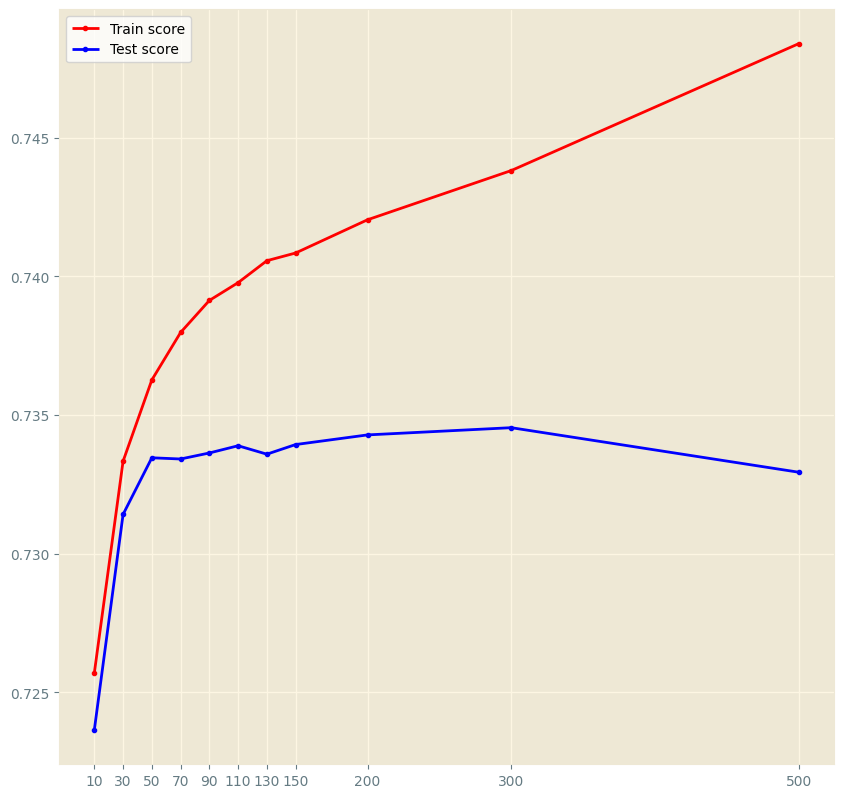

In [ ]:
draw_accuracy_benchmark_forests(res)

Несмотря на сложность исходных данный, метод градиентого бустинга деревьев показаль чуть более лучший результат в сравнении со случайным лесом. Видно, что хоть и модель подверженна перобучению; это влияние не настолько сильно как в случае, например, с SVM или методом KNN

## Вывод

Исходные данные оказались достаточно искаженными, и все использованные классификаторы не смогли увеличить точность выше 75 процентов. Однако не смотря на это метод PCA + SVM и Gradient boosted trees показали себя лучше, чем fully connected сеть или random tree классификатор. Есть подозрения, что в данные добавлен статистический шум, что, возможно, удастся визуализировать и каким-то образом компенсировать методами класстеризации

# DBSCAN

In [5]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.7, random_state = 8)
X_train = (X_train-X_train.min())/(X_train.max()- X_train.min())

In [6]:
X_train

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active
8684,0.973116,0.0,0.595855,0.315789,0.352941,0.388889,0.0,0.0,0.0,0.0,1.0
67062,0.466921,0.0,0.580311,0.374269,0.411765,0.444444,0.0,0.0,0.0,0.0,1.0
7974,0.592613,0.0,0.554404,0.304094,0.352941,0.388889,0.0,0.0,0.0,0.0,1.0
17434,0.505805,0.0,0.564767,0.485380,0.176471,0.388889,0.0,0.0,0.0,0.0,1.0
68944,0.456791,1.0,0.538860,0.391813,0.235294,0.388889,0.0,0.0,1.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...
5480,0.973584,0.0,0.549223,0.339181,0.294118,0.388889,0.0,0.0,0.0,0.0,1.0
10376,0.289254,0.0,0.512953,0.280702,0.235294,0.333333,0.0,0.0,0.0,0.0,1.0
62426,0.965168,1.0,0.569948,0.397661,0.294118,0.388889,0.0,0.0,1.0,0.0,1.0
18417,0.567833,0.0,0.595855,0.421053,0.235294,0.388889,0.0,0.0,0.0,0.0,0.0


In [23]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import classification_report

Y_pred = DBSCAN(eps=1.0 , n_jobs=-1).fit_predict(X_train.to_numpy())
res = classification_report(Y_train.to_numpy(), Y_pred)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [24]:
{n:sum(np.array(Y_pred == n, dtype=np.int)) for n in set(Y_pred)}

{0: 18488,
 1: 928,
 2: 257,
 3: 424,
 4: 241,
 5: 84,
 6: 44,
 7: 172,
 8: 44,
 9: 52,
 10: 49,
 11: 148,
 12: 6}

In [26]:
df_to_show = X_train.copy()
df_to_show['class'] = Y_pred

Результаты DBSCAN

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

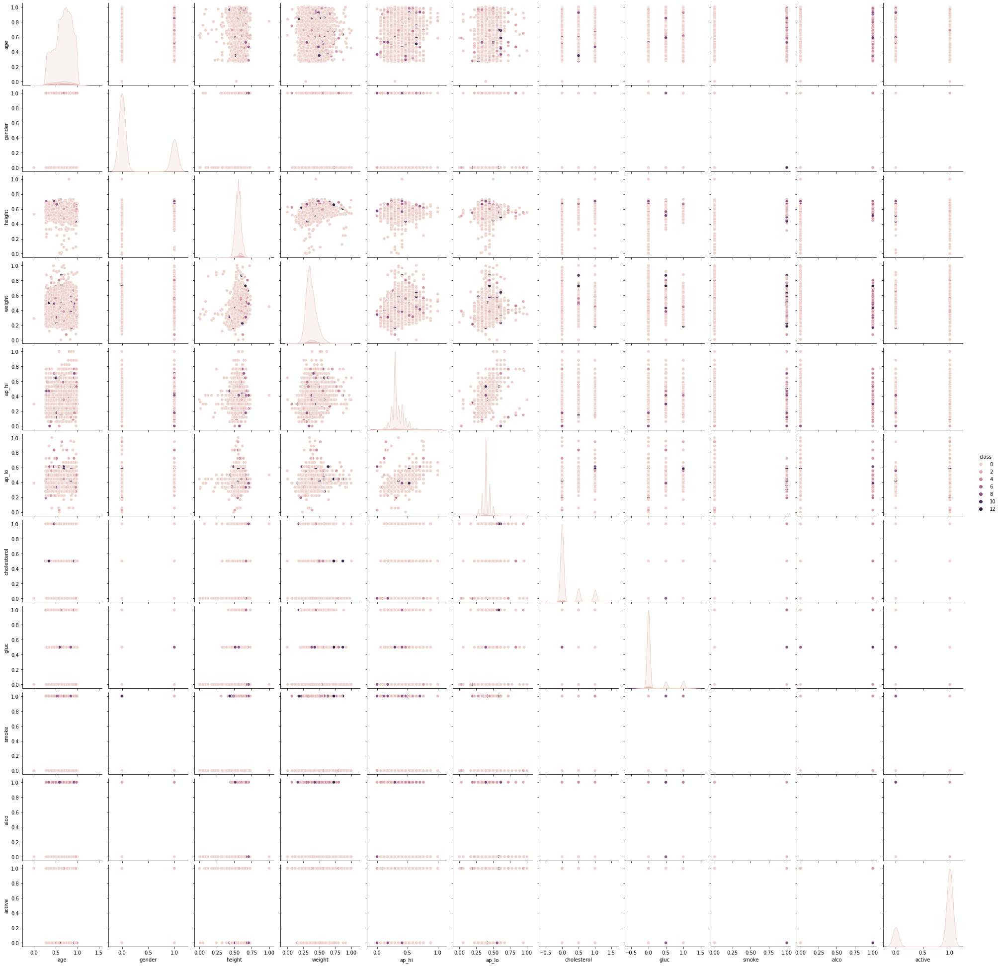

In [27]:
sns.pairplot(df_to_show, hue='class')

Видно, что алгоритм практически не разбил выборку на кластеры, составив, по сути, один большой кластер

"GROUND TRUTH"

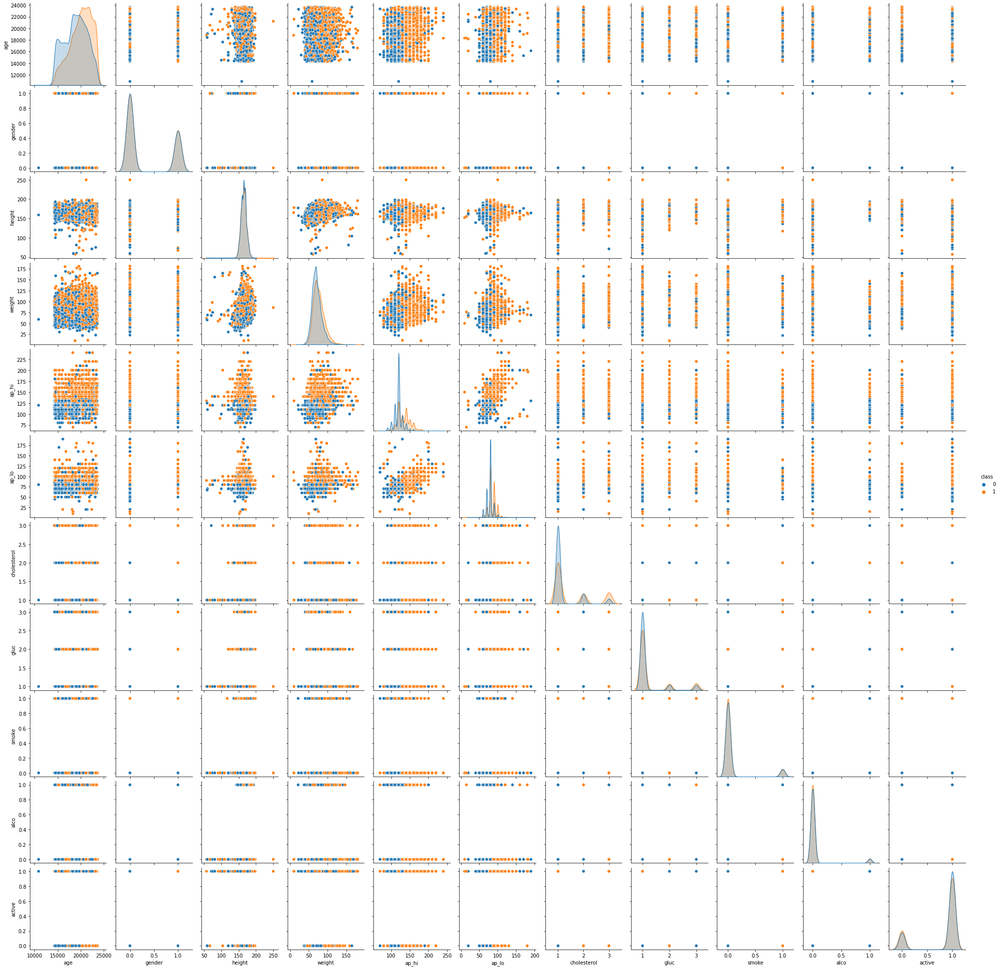

In [97]:
df_to_show = X_train.copy()
df_to_show['class'] = Y_train
sns.pairplot(df_to_show, hue='class')